# Машинное обучение, ВМК МГУ

# Практическое задание 1. Обучение без учителя.

## Общая информация
Дата выдачи: 22.02.2024

Мягкий дедлайн: 07.03.2024 23:59 MSK

Жёсткий дедлайн: 14.03.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-1-Username.ipynb

Username — ваша фамилия на латинице

## О задании



В этом задании вам предлагается поработать с различными методами кластеризации и посмотреть их работу на различных данных

In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

## Часть 1. Тематическое моделирование текстов.

В этом задании мы сравним разные алгоритмы кластеризации для задачи тематического моделирования.

**Задание 1.1 (1 балл).** Для начала реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Здесь необходимо использовать вариацию с ненормированным лапласианом.

In [155]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from scipy.linalg import eig, eigh
from scipy.sparse import issparse

class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''
        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''
        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels
    # def _exp_kernel(self, X):
    #     _v = -np.sum(X**2, axis=1)
    #     return  np.exp((_v.reshape(-1, 1) + 2 *  X @ X.T  + _v.reshape(1, -1)) / 2* self.sigma**2)
    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        
        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        W = X
        D = np.diag(np.sum(W, axis = 1)) if not issparse(W) else np.diag(np.array(W.sum(axis=1))[0])
        L = D - W
        eigh_res = eigh(L, overwrite_a=True, subset_by_index=[0, self.n_components-1])
        res = np.asarray(eigh_res[1].real)
        return res 

In [677]:
from numpy.linalg import eig
X = np.array([[0, 1],
                [2, 1], 
                [3, 1]])
_v = -np.sum(X**2, axis=1)
W = np.exp((_v.reshape(-1, 1) + 2 *  X @ X.T  + _v.reshape(1, -1)) / 2* 0.5**2)
D = np.diag(np.sum(W, axis = 1))
print(W)
print(D)
L = D - W
print(eig(L)[-1].real)

[[1.         0.60653066 0.32465247]
 [0.60653066 1.         0.8824969 ]
 [0.32465247 0.8824969  1.        ]]
[[1.93118313 0.         0.        ]
 [0.         2.48902756 0.        ]
 [0.         0.         2.20714937]]
[[-0.57735027 -0.78802494  0.21373666]
 [-0.57735027  0.20891109 -0.78931795]
 [-0.57735027  0.57911385  0.57558128]]


Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [714]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)
graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)
true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]
assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


**Задание 1.2 (0.5 балла)** Теперь приступим к применению разных алгоритмов кластеризации для одной из самых популярных задач обучения без учителя: задачи тематического моделирования текстов.

Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. То есть, фактически, перед вами стоит задача кластеризации текстов с тем лишь дополнением что требется не только разбить тексты на группы, но и выделить ключевые слова, определяющие каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [2]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [3]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
nltk.download('wordnet')
nltk.download('stopwords')
wl = WordNetLemmatizer()
sw = set(stopwords.words('english'))
lem = lambda text:  ' '.join([word for word in [wl.lemmatize(word) if word != 'said' else 'say' for word in text.split(' ')] if word not in sw])

[nltk_data] Downloading package wordnet to /Users/dirak/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/dirak/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
data['data'] = ((data['title'] + ' ' + data['content']).str.lower().replace('[^a-z ]+', ' ', regex=True).replace(' +', ' ', regex=True)).apply(lem)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [311]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

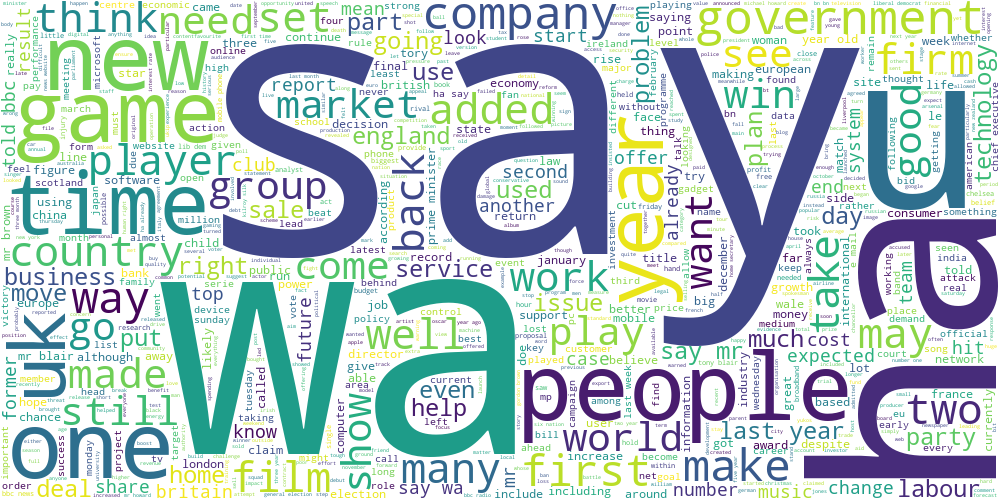

In [235]:
draw_wordcloud(data.data)

**Задание 1.3 (1 балл).** Начнем с простого: обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. (?) Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [308]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

class TfidfClustering(ClusterMixin):
    def __init__(self, n_clusters=8, **kwargs):
        self.n_clusters = n_clusters
        self.kmeans = KMeans(n_clusters=self.n_clusters, **kwargs)
        self.tfidf = TfidfVectorizer()

    def fit_predict(self, X, y=None):
        labels = self.kmeans.fit_predict(self.tfidf.fit_transform(X, y))
        return labels
    
    def transform(self, X):
        return self.kmeans.transform(self.tfidf.transform(X))

In [309]:
tfc = TfidfClustering(n_clusters=8)
labels = tfc.fit_predict(data.data)

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


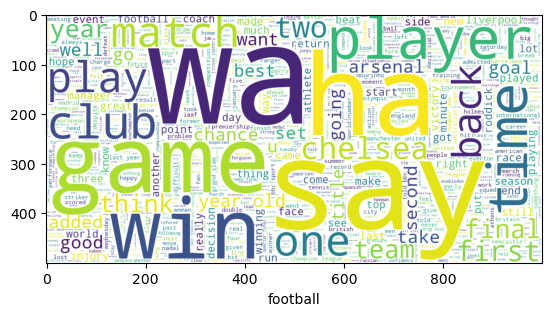

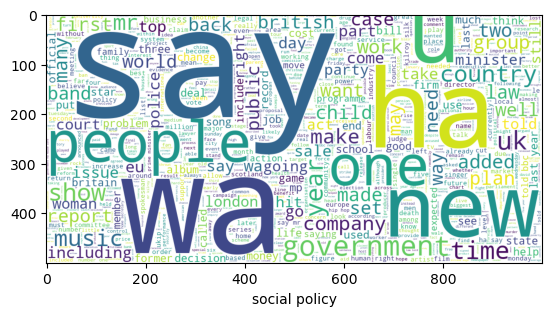

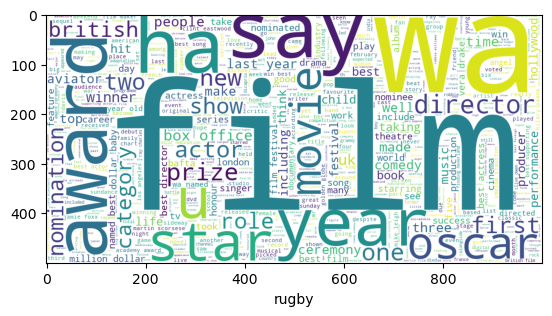

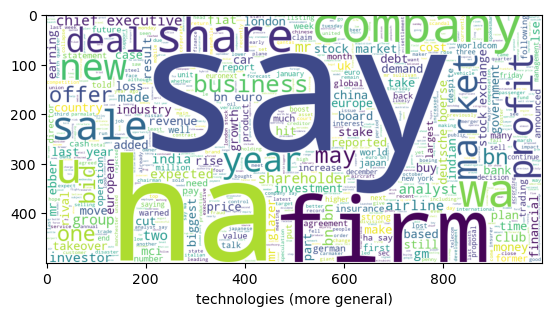

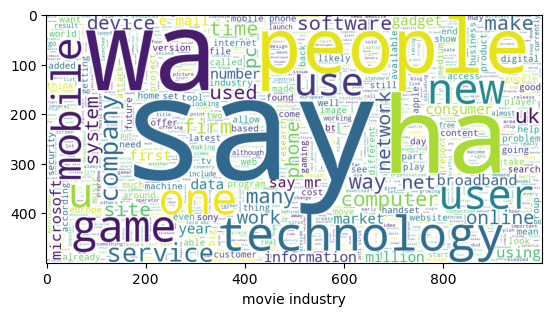

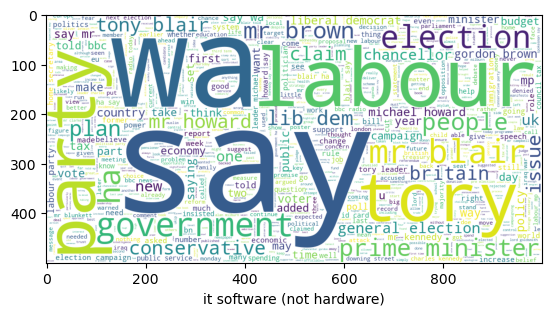

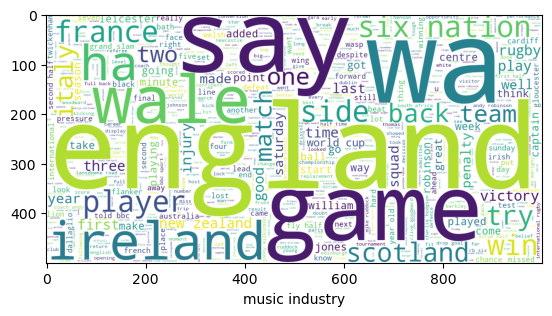

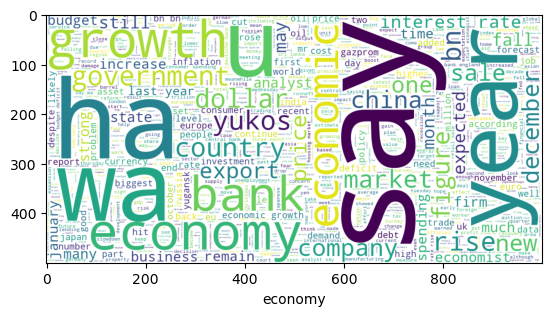

In [312]:
themes = ['football', 'social policy', 'rugby', 'technologies (more general)', 'movie industry', 'it software (not hardware)', 'music industry', 'economy']
for label, theme in zip(np.unique(labels), themes):
    plt.figure()
    plt.imshow(draw_wordcloud(data.data.loc[labels == label]))
    plt.xlabel(theme)

Темы получились достаточно интерпретируемыми, так в большинстве из них встречаются достаточно специфичные слова, чтобы определить что за тема выбрана (software, economy, film, labour ...). Хотя к примеру темы футбола и рэгби или технологий и IT ПО достаточно похожи по словам и отличаются не так сильно.

**Задание 1.4 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на несколько слов с наибольшими числовыми значениями. (?) Соответствуют ли полученные слова облакам тегов из прошлого задания?

**Ответ:**

In [322]:
for theme in np.arange(tfc.kmeans.n_clusters):
    mw = np.argsort(tfc.kmeans.cluster_centers_[theme, :])[-20:]
    print(f"{theme} "  + ", ".join(key for key, val in tfc.tfidf.vocabulary_.items() if val in mw))

0 time, year, say, ha, final, wa, club, world, play, first, player, win, match, cup, team, game, chelsea, season, champion, arsenal
1 year, one, say, ha, also, lord, wa, music, government, new, mr, minister, would, law, show, uk, country, people, album, band
2 year, ha, film, box, wa, director, best, award, star, category, prize, ceremony, actor, nomination, movie, actress, comedy, oscar, festival, aviator
3 sale, profit, bn, year, firm, say, ha, company, financial, wa, executive, market, deal, euro, mr, airline, share, bid, gm, stock
4 say, user, ha, service, broadband, music, net, people, technology, mobile, phone, game, digital, site, virus, network, computer, software, microsoft, device
5 say, wa, government, mr, minister, tax, would, leader, election, brown, plan, party, prime, labour, chancellor, conservative, howard, blair, tory, lib
6 try, half, side, six, france, scotland, nation, player, win, italy, injury, match, ireland, team, game, england, wale, rugby, robinson, coach
7 b

Да соответствует.

**Задание 1.5 (можно получить 1.5, 1 или 2.5 баллов)** Попробуем усовершенствовать метод. Реализуйте в приведенном ниже шаблоне ядерный K-means(1.5 баллов) или эллипсоидный метод(1 балл) (можно оба сразу, тогда баллы сложатся). И попробуйте применить его для решаемой задачи. (?)Насколько существенно отличаются  центры кластеров и облака тегов от таковых для предыдущих методов?

In [481]:
from numpy.random import randint
from scipy.sparse import issparse
from tqdm import tqdm

class KernelKMeans:
    def __init__(self, n_clusters, iters):
        """
        KMeans Class constructor.

        Args:
        n_clusters (int) : Number of clusters used for partitioning.
        iters (int) : Number of iterations until the algorithm stops.

        """
        self.n_clusters, self.iters, self.sigma = n_clusters, iters, 0.1

    def __euclid_norm(self, X, Y=None):
        if issparse(X):
            _xv = np.sum(X.power(2), axis=1)
        else:
            _xv = np.sum(X**2, axis=1)
        if Y is None:
            _yv =_xv
            Y = X
        else:
            if issparse(Y):
                _yv = np.sum(Y.power(2), axis=1)
            else:
                _yv = np.sum(Y**2, axis=1)
        return np.array(_yv.reshape(1, -1) - 2 * X @ Y.T + _xv.reshape(-1, 1))
    
    def __exp_kernel(self, X):
        euc_norm = -self.__euclid_norm(X)
        return  np.array(np.exp(euc_norm / 2* self.sigma**2))
        
    def initialize_clusters(self, X, n_clusters):
        """
        Initialize centroids.

        Args:
        X (ndarray): Dataset samples
        n_clusters (int): Number of clusters

        Returns:
        centroids (ndarray): Initial position of centroids
        """
        _c = np.zeros((n_clusters, X.shape[1]))
        _c[0] = X[randint(low=0, high=X.shape[0])].toarray() 
        for i in range(1, n_clusters):
            _cr = _c[:i]
            _dist = self.__euclid_norm(_cr, X)
            _mask = np.argmin(_dist, axis=0)
            # print(np.argmax(_dist[_mask, np.arange(_dist.shape[1])]))
            _c[i] = X[np.argmax(_dist[_mask, np.arange(_dist.shape[1])])].toarray() 

        _dist = self.__euclid_norm(_c, X)
        self._mask = np.argmin(_dist, axis=0)
        self.__calc_bit_mask(X)
        
        return _c

    def __calc_bit_mask(self, X):
        self._Ck = np.zeros(self.n_clusters)
        self._bit_mask = np.zeros((self.n_clusters, X.shape[0]))

        for i_clust in np.arange(self.n_clusters):
            self._bit_mask[i_clust] = self._mask == i_clust
            self._Ck[i_clust] = np.sum(self._bit_mask[i_clust])
        self._Ck = self._Ck.reshape(-1, 1)
    
    def fit_predict(self, X):
        """
        Implementation of the kernel KMeans algorithm.

        Args:
        X (ndarray): Dataset samples

        Returns:
        centroids (ndarray): Computed centroids
        labels (ndarray): Predicts for each sample in the dataset.
        """
        self._c = self.initialize_clusters(X, self.n_clusters)
        # print(self._Ck, np.unique(self._mask))
        for it in tqdm(np.arange(self.iters)):
            _kmatr = self.__exp_kernel(X)
            # print(type(_kmatr))
            score_matrix = np.diag(_kmatr).reshape(1, -1)
            score_matrix = score_matrix - (2 / self._Ck) * self._bit_mask @ _kmatr 
            # print(self._bit_mask)
            # print((self._bit_mask  * (self._bit_mask @ _kmatr)).shape)
            score_matrix = score_matrix + (1 / (self._Ck **2)) *  np.sum(self._bit_mask  * (self._bit_mask @ _kmatr) , axis=1).reshape(-1, 1)
            self._mask = np.argmin(score_matrix, axis = 0)
            
            self.__calc_bit_mask(X)
            self._c = (self._bit_mask @ X) / self._Ck

        return self._c, self._mask

            
    
    def get_centroids(self):
        """
        Return the computed centroids
        """
        return self._c

In [483]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

class TfidfKernelClustering(ClusterMixin):
    def __init__(self, n_clusters=8, iters= 30):
        self.n_clusters = n_clusters
        self.kkmeans = KernelKMeans(n_clusters=self.n_clusters, iters=iters)
        self.tfidf = TfidfVectorizer()

    def fit_predict(self, X, y=None):
        vec = self.tfidf.fit_transform(X, y)
        labels = self.kkmeans.fit_predict(vec)
        return labels

In [476]:
tfc = TfidfKernelClustering(n_clusters=8, iters=30)
centroids, labels = tfc.fit_predict(data.data)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:10<00:00,  2.95it/s]


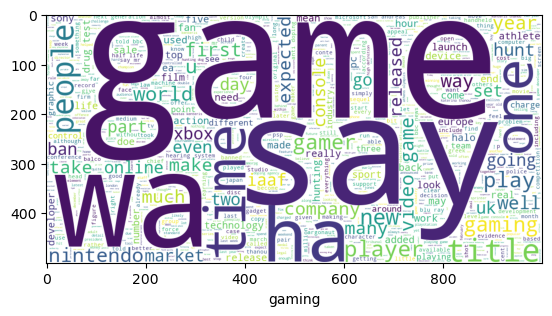

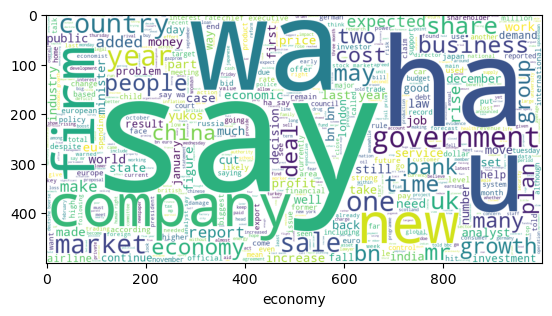

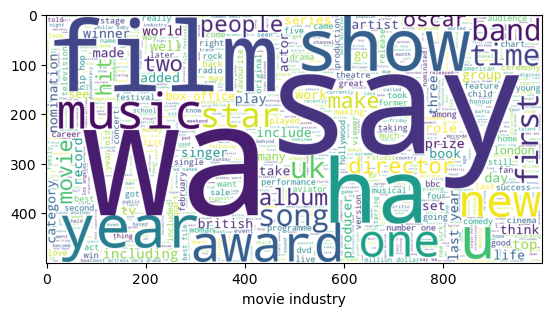

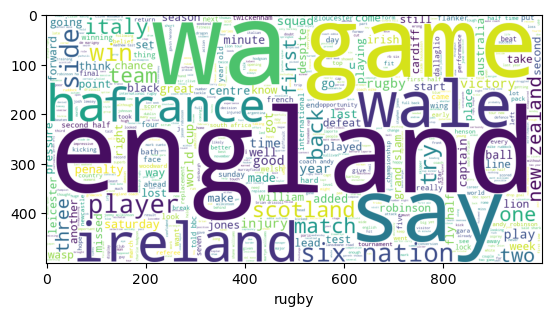

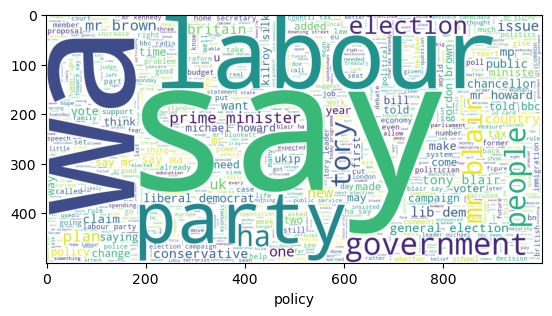

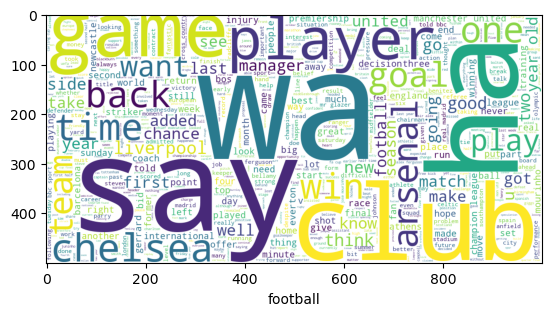

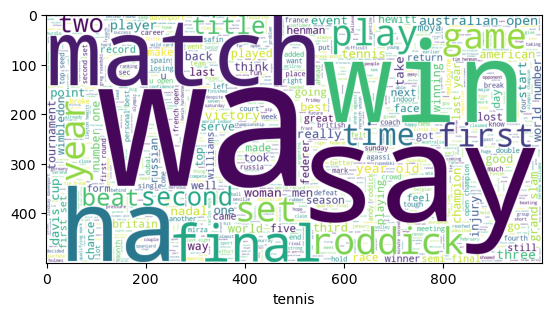

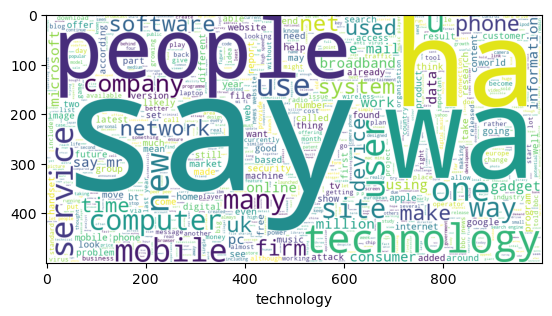

In [479]:
themes = ['gaming', 'economy', 'movie industry', 'rugby', 'policy', 'football',  'tennis', 'technology']
for label, theme in zip(np.unique(labels), themes):
    plt.figure()
    plt.imshow(draw_wordcloud(data.data.loc[labels == label]))
    plt.xlabel(theme)

In [ ]:
class EllipsisKMeans:
    def __init__(self, n_clusters, iters):
        """
        KMeans Class constructor.

        Args:
        n_clusters (int) : Number of clusters used for partitioning.
        iters (int) : Number of iterations until the algorithm stops.

        """
        pass
 
    def initialize_clusters(self, X, n_clusters):
        """
        Initialize centroids.

        Args:
        X (ndarray): Dataset samples
        n_clusters (int): Number of clusters

        Returns:
        centroids (ndarray): Initial position of centroids
        """
        pass

 
    def fit_predict(self, X):
        """
        Implementation of the kernel KMeans algorithm.

        Args:
        X (ndarray): Dataset samples

        Returns:
        centroids (ndarray): Computed centroids
        labels (ndarray): Predicts for each sample in the dataset.
        """
        pass
    
    def get_centroids(self):
        """
        Return the computed centroids
        """
        pass

Многие выделенные темы совпадают так же как и облака слов, к примеру 3 кластер выделил новости киноиндустрии, так же как и предыдущий метод, так же как и предыдущий метод новый выделил футбольную тему, тему рэгби, тему социальной политики и экономическую. Но вдобавок к этому появились новые темы так вемсто software и технологий вцелом появилась просто тема технологий и гейминга (с клучевым словом nintendo). Так же стоит указать, что модель в отдельную хорошо определяемую тему выделила новости про теннис. Стоит сделать вывод, что благодаря нелинейности модели смогли выделить более узконаправленные темы и пропали сложно разделяемые пары тем (как software и technologies).

**Задание 1.6 (0.5 балла).** Теперь попробуем сравнить три разных алгоритма кластеризации. Получите три разбиения на кластеры с помощью алгоритмов K-Means(любого понравившегося), DBSCAN(можно взять готовый из sklearn) и спектральной кластеризации, реализованной вами выше. Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

In [539]:
from sklearn.base import ClusterMixin
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.text import TfidfVectorizer

class TfidfDBSCANClustering(ClusterMixin):
    def __init__(self, eps=0.5, min_samples=40):
        self.eps = eps
        self.dbscan = DBSCAN(eps=self.eps, min_samples=min_samples)
        self.tfidf = TfidfVectorizer()

    def fit_predict(self, X, y=None):
        vec = self.tfidf.fit_transform(X, y)
        labels = self.dbscan.fit_predict(vec)
        return labels

In [715]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import kneighbors_graph

class TfidfGraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        self.n_clusters = n_clusters
        self.n_components = n_components
        self.sigma = 0.1
        self.gc = GraphClustering(n_clusters=self.n_clusters, n_components=n_components, **kwargs)
        self.tfidf = TfidfVectorizer()

    def fit_predict(self, X, y=None):
        vec = self.tfidf.fit_transform(X, y)
        labels = self.gc.fit_predict(kneighbors_graph(vec, n_neighbors=80, mode='distance', metric='euclidean'))
        return labels

**Calculations for comparison**

In [694]:
tfkc = TfidfKernelClustering(n_clusters=8, iters=30)
centroidsK, labelsK = tfkc.fit_predict(data.data)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:09<00:00,  3.31it/s]


In [629]:
vals = {}
for eps in  [1.262]:#np.logspace(-2, 1, 20):
    tfdbc = TfidfDBSCANClustering(eps=1.262, min_samples=30)
    labelsDB = tfdbc.fit_predict(data.data)
    if len(np.unique(labelsDB)) > 0:
        vals[eps] = []
        for ind in np.unique(labelsDB):
            vals[eps].append(np.sum(labelsDB == ind))

In [ ]:
tfgc = TfidfGraphClustering(n_clusters=8, init='k-means++')
tfgc.sigma = 0.5
labelsG = tfgc.fit_predict(data.data)

In [720]:
np.unique(labelsG, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32),
 array([ 222,  298,  136,  174,  121,  107, 1027,  140]))

(?) Теперь постройте облака слов и снова проинтерпретируйте темы. 

**DBSCAN**

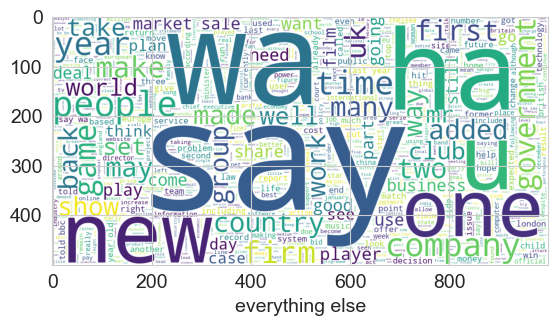

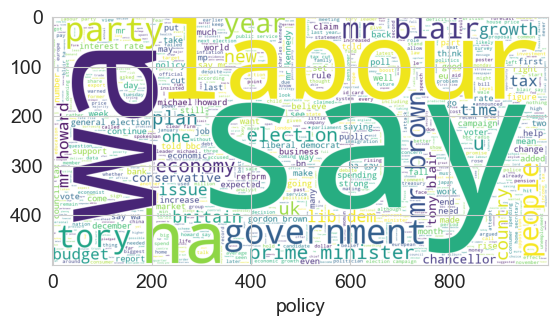

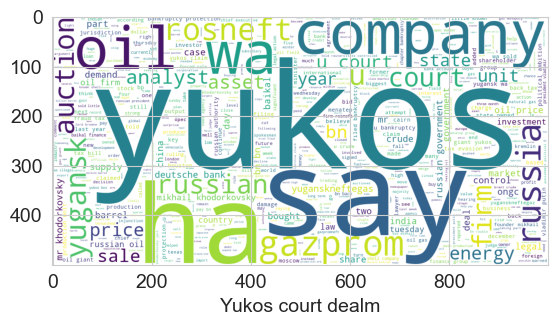

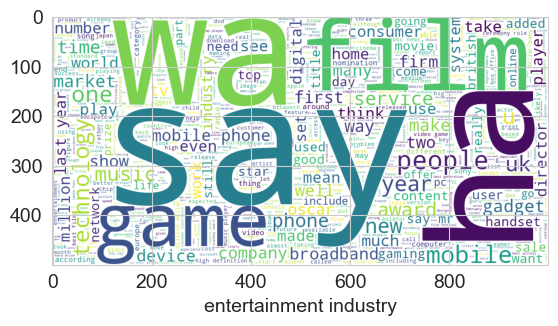

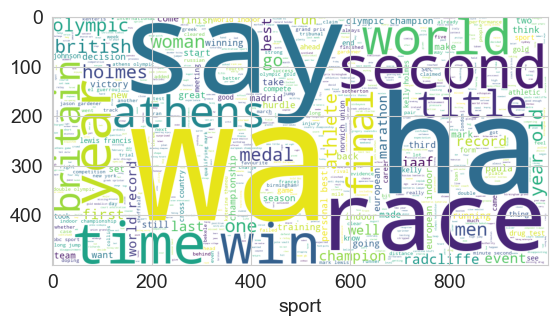

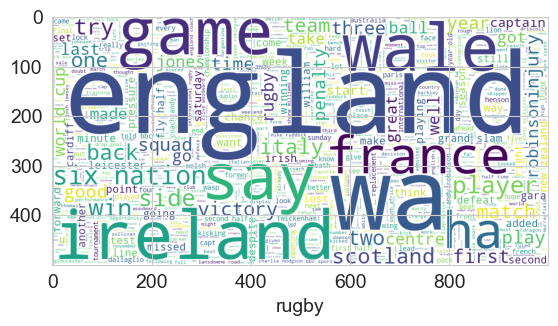

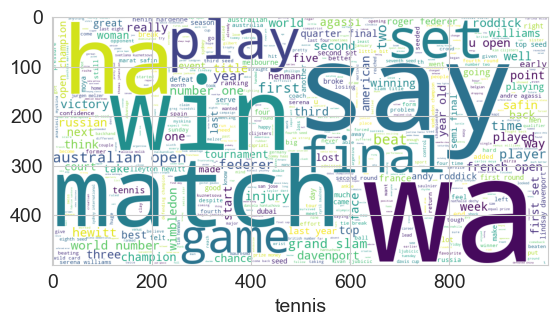

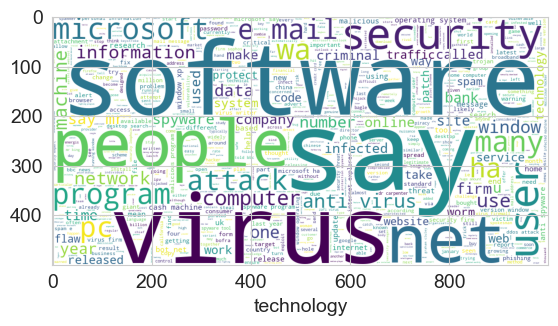

In [718]:
themes = ['everything else', 'policy', 'Yukos court dealm', 'entertainment industry', 'sport', 'rugby', 'tennis', 'technology']
for label, theme in zip(np.unique(labelsDB), themes):
    plt.figure()
    plt.imshow(draw_wordcloud(data.data.loc[labelsDB == label]))
    plt.xlabel(theme)

**Graph**

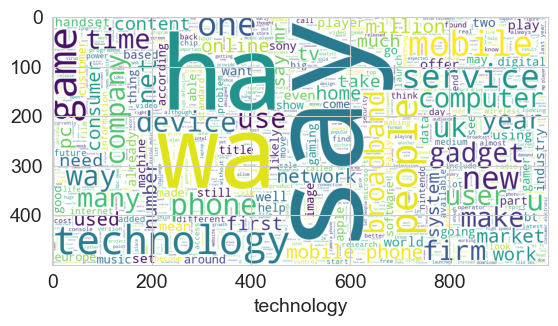

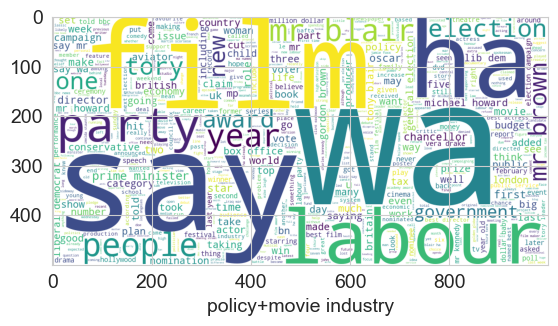

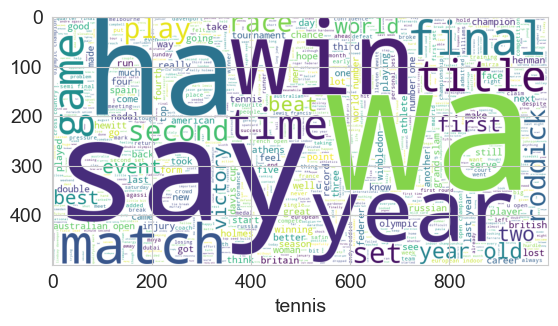

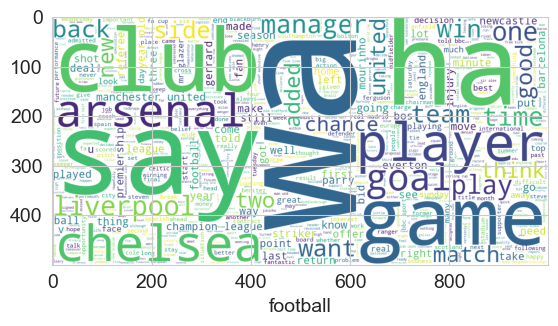

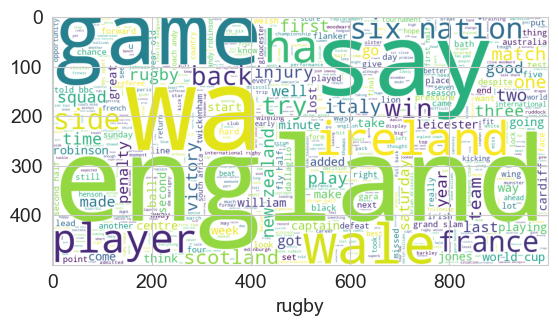

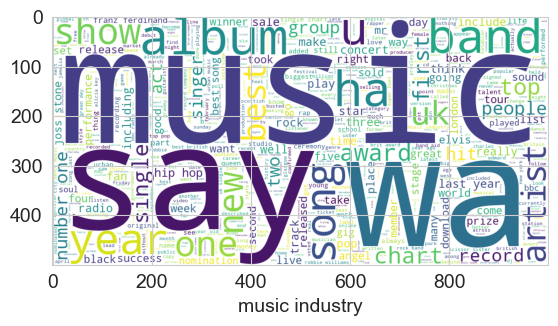

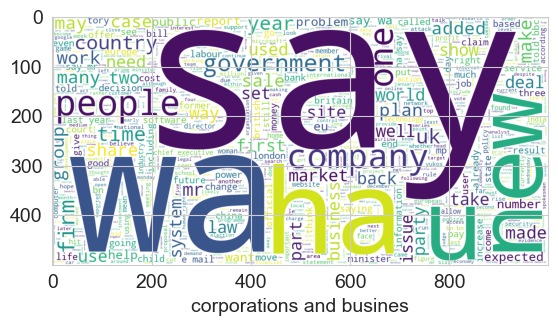

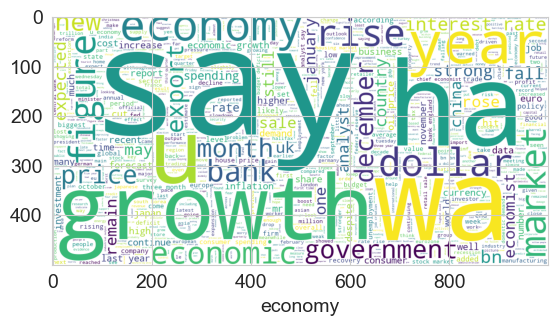

In [721]:
themes = ['technology', 'policy+movie industry', 'tennis', 'football', 'rugby', 'music industry',  'corporations and busines', 'economy']
for label, theme in zip(np.unique(labelsG), themes):
    plt.figure()
    plt.imshow(draw_wordcloud(data.data.loc[labelsG == label]))
    plt.xlabel(theme)

**Kernel**

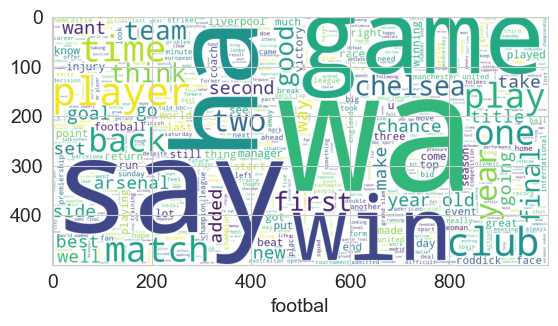

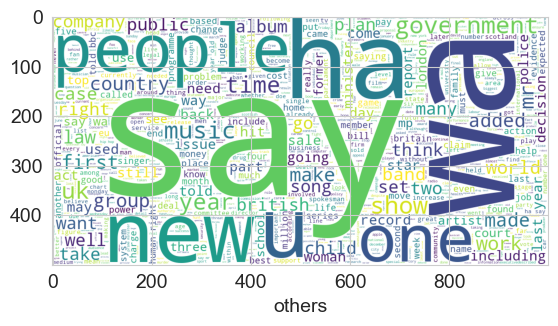

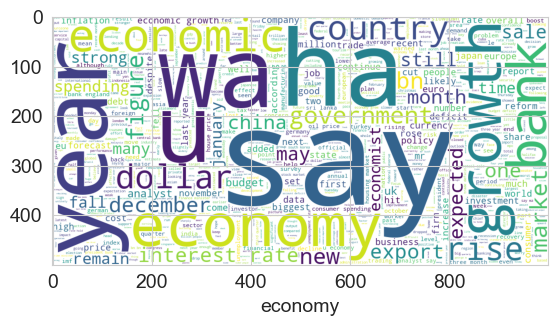

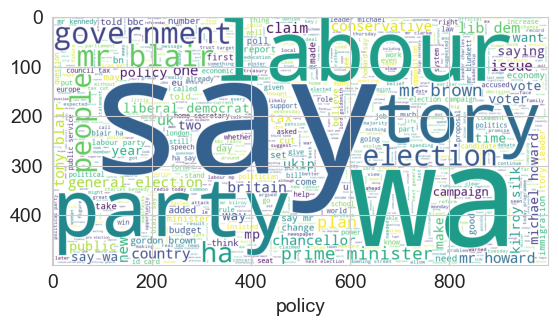

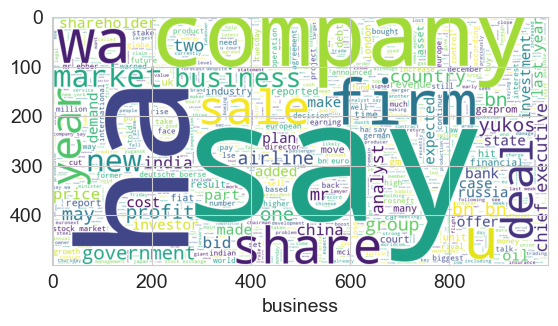

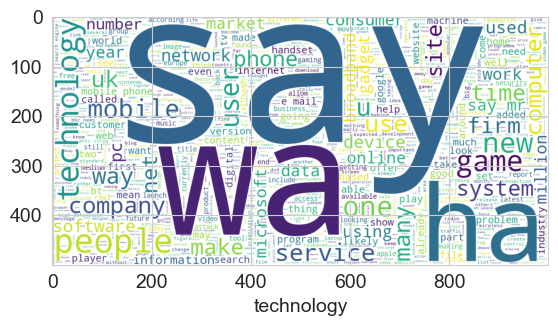

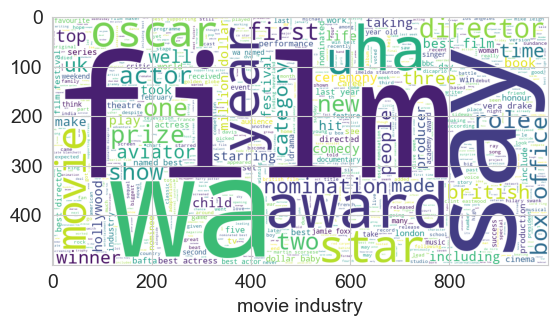

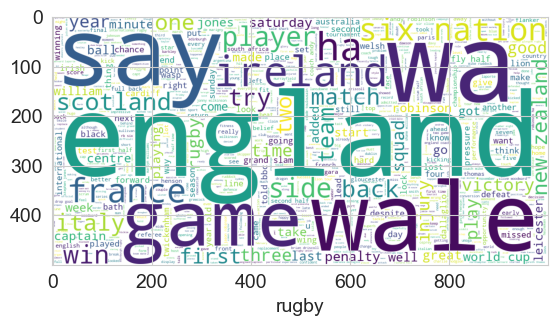

In [744]:
themes = ['footbal', 'others', 'economy', 'policy', 'business', 'technology',  'movie industry', 'rugby']
for label, theme in zip(np.unique(labelsK), themes):
    plt.figure()
    plt.imshow(draw_wordcloud(data.data.loc[labelsK == label]))
    plt.xlabel(theme)

**Задание 1.6 (1 балл).** Также, для анализа качества кластеризации иногда бывает полезно "посмотреть" накластеры. Обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [723]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.base import TransformerMixin

plt.rcParams.update({'font.size': 14})
sns.set_style('whitegrid')

In [730]:
class TfidfTSNE(TransformerMixin):
    def __init__(self, init="random"):
        self.eps = eps
        self.tsne = TSNE(init=init)
        self.tfidf = TfidfVectorizer()

    def fit_transform(self, X, y=None):
        vec = self.tfidf.fit_transform(X, y)
        res = self.tsne.fit_transform(vec)
        return res

In [661]:
def project_show(x1, x2, labels=None):
    sns.scatterplot(x=x1, y=x2, hue=labels)

In [732]:
tftsn = TfidfTSNE()
X_p = tftsn.fit_transform(data.data)

In [745]:
print(np.unique(labelsK, return_counts=True))

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([379, 531, 154, 226, 305, 340, 175, 115]))


Text(0.5, 1.0, 'DBSCAN')

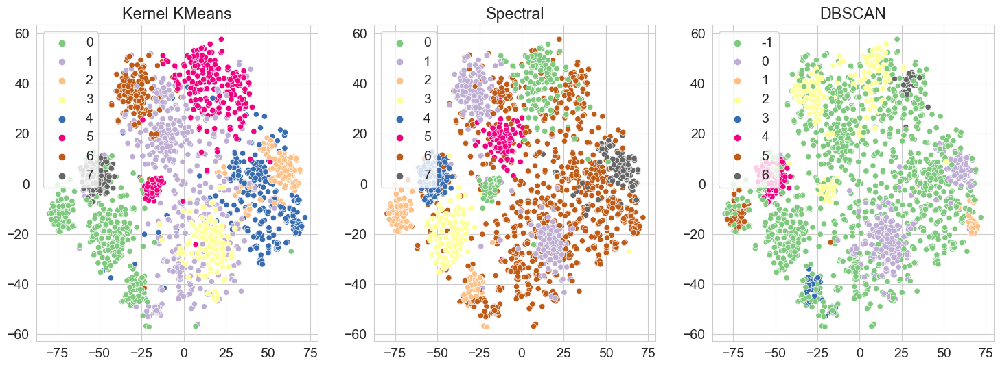

In [748]:
_, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labelsK, ax=ax[0], palette=plt.get_cmap('Accent'), legend='full')
ax[0].set_title('Kernel KMeans')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labelsG, ax=ax[1], palette=plt.get_cmap('Accent'), legend='full')
ax[1].set_title('Spectral')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labelsDB, ax=ax[2], palette=plt.get_cmap('Accent'), legend='full')
ax[2].set_title('DBSCAN')

In [749]:
print(np.unique(labelsK, return_counts=True))
print(np.unique(labelsDB, return_counts=True))
print(np.unique(labelsG, return_counts=True))

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([379, 531, 154, 226, 305, 340, 175, 115]))
(array([-1,  0,  1,  2,  3,  4,  5,  6]), array([1370,  307,   33,  285,   48,   96,   51,   35]))
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([ 222,  298,  136,  174,  121,  107, 1027,  140]))


(?) Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Сделаете выводы о каждом исследованном в части 1 алгоритме и их применимости к задаче тематического моделирования. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:**
Отметим несколько наблюдений:
1. Во всех методах присутствует класс, в который попадает все что не попало в другие (обычно самый большой). Главной его особенностью является низкая концентрация и большая дисперсия его членов. Такими классами являются класс 1 для Kernel Kmeans, класс 6 для Spectral и класс -1 (выброс) в DBSCAN. Но если во 2 и 3 методе он ярковыраженно проходит по всему занимаемому объектами пространству, то в случае Kernel Kmeans объекты более сконцентрированы.
2. Дисбаланс классов у kernel kmeans сильно меньше, чем у других методов. Так в "остаточный" класс у спектрального и DBSCAN попало по 1370б 1027 объектов, то есть около $\frac{1}{2}$ выборки, а у 1 ого метода только 531.
3. Также стоит отметить, что у оставшихся классов у DBSCAN наибольший дисбаланс, что кроме вывода сверху было заметно и по темам, когда метод выделял не просто какие-то сферы жизни человека, а конкретные громкие события в них (к примеру дело ЮКОСА).


Оценка каждого алогоритма:
1. Kernel Kmeans:
    Быстрый метод. Делает достаточно сбалансированное выделение классов и не раздувает "остаточный" класс. Благодаря ядру имеет хорошую гибкость позволяя обрабатывать невыпуклые кластеры. Хорошо подходит, если необходимо выделить максимально широкие темы.
2. Сluster:
    Большая вычислительная сложность из-за необходимости нахождения собственных векторов. Хорошо выделяет широкие темы, но значительно больше объектов определяет в класс остальные. Подходит в ситуации, когда стоит задача определения текста к конкретному классу, но в случае задачи моделирования, когда отказ от классификации не приемлем, лучше использовать Kernel Means
3. DBSCAN:
    Большая вычислительная сложность. Требует тонкого подбора гиперпараметров, без которого не показывает никакого результата, все сводя в 1 класс (либо выбросов, либо просто в какой-то класс). Хорошо подходит, когда необходимо точечно выделить какую-то специфичную тему(к примеру какой-то инфоповод) и не годится для задач тематического моделирования(когда нужно определить общую направленность статьи).

    

## Часть 2. Transfer learning для задачи классификации текстов.

**Задание 3.1 (4 балла).** Вспомним, что у нас есть разметка для тематик статей. Просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 1:13:6. 70% выборки будем использовать для обучения, а остальные 30% для валидации

Обучите метрику Махаланобиса любыми **тремя**  методами (отсюда)[http://contrib.scikit-learn.org/metric-learn/supervised.html] только на маленьком куске (5%) обучающей выборки. Кластеризуйте данные методом k-means с обученными метриками  и проанализирйте полученные результаты.

Сравните 3 подхода к класификации:

Логистическая регрессия на tf-idf признаках

K-Means с евклидовой метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

K-Means с обученной метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всей обучающей выборке целиком (70%), а итоговый классификатор и обучение метрики обучайте только на ее маленьком куске (5%). Подберите гиперпараметры моделей по качеству на валидационной выборке (30%), а затем оцените качество на тестовой выборке (не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации).

**В качестве метрики качества используйте accuracy**

Можете провести дополнительные исследования с другими методами кластеризации и получить более высокое качество. За качественные исследования с хорошим описанием можно получить **до 2 бонусных баллов**.

In [7]:
y = data.category.copy()
du = y.unique()
y.replace(du,np.arange(len(du)), inplace=True)
y = y.to_numpy()

In [59]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
X = TfidfVectorizer(min_df=0.01).fit_transform(data.data)
X_tr, X_test, y_tr, y_test = train_test_split(X, y, test_size=0.25, random_state=666)
X_train_gen, X_val, y_train_gen, y_val = train_test_split(X_tr, y_tr, test_size=0.3, random_state=666)
X_train_labeled, X_train, y_train_labeled, y_train = train_test_split(X_train_gen, y_train_gen, test_size=0.92857, random_state=666)

In [6]:
!pip install metric-learn==0.7.0

In [76]:
from metric_learn import LMNN, NCA, MLKR
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from tqdm import tqdm
import time

def transform(model, X_train_labeled, X_train, X_val, y_train_labeled):
    model.fit(X_train_labeled.toarray(), y_train_labeled)
    X_train_tr = model.transform(X_train)
    X_train_m_tr = model.transform(X_train_labeled)
    X_val_tr = model.transform(X_val)
    return X_train_tr, X_train_m_tr, X_val_tr, model

def check_method(check_val, n_runs, X_train_labeled_tr, X_train_tr, X_val_tr, y_train_labeled, y_val, C):
    scores = np.zeros((len(check_val), n_runs))
    for i_cl, n_cl in enumerate(tqdm(check_val)):
        for run in tqdm(range(n_runs),leave=False):
            kmeans  = KMeans(n_clusters=n_cl, n_init=10)
            kmeans.fit(X_train_tr)
            centroids = kmeans.cluster_centers_
            dist_tr = euclidean_distances(X_train_labeled_tr, centroids)
            dist_val = euclidean_distances(X_val_tr, centroids)
            logreg = LogisticRegression(penalty='l2', max_iter=1000, C=C)
            logreg.fit(dist_tr, y_train_labeled)
            scores[i_cl][run] = accuracy_score(y_val, logreg.predict(dist_val))
            time.sleep(1)
    return scores

In [77]:
from matplotlib import pyplot as plt

def show_scores(scores, check_val, method_name):
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.boxplot(scores.T, labels=[f"{v}" for v in check_val])

    ax.set_title(method_name)
    ax.set_xlabel("Clusters number")
    ax.set_ylabel("Validation accuracy")
    ax.grid(True)

def final_result(X_train, X_train_labeled, X_test, y_train_labeled, y_test, n_cl, C):
    kmeans  = KMeans(n_clusters=n_cl, n_init=10)
    kmeans.fit(X_train)
    centroids = kmeans.cluster_centers_
    dist_tr = euclidean_distances(X_train_labeled, centroids)
    dist_test = euclidean_distances(X_test, centroids)
    logreg = LogisticRegression(penalty='l2', max_iter=1000, C=C)
    logreg.fit(dist_tr, y_train_labeled)
    return accuracy_score(y_test, logreg.predict(dist_test))

**Сравнение алгоритмов обучения расстояния Махаланобиса**

In [131]:
X_, X_l, _, y_l = train_test_split(X, y, test_size=0.05, random_state=666)

In [140]:
from sklearn.feature_extraction.text import TfidfVectorizer

def get_labels(model, X_labeled, X, y_labeled, n_clusters, **kwargs):
    kmean = KMeans(n_clusters=n_clusters, **kwargs)
    model.fit(X_labeled.toarray(), y_labeled)
    vec = model.transform(X)
    labels = kmean.fit_predict(vec)
    return labels

In [157]:
from sklearn.neighbors import kneighbors_graph
class Graph(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        self.n_clusters = n_clusters
        self.n_components = n_components
        self.sigma = 0.1
        self.gc = GraphClustering(n_clusters=self.n_clusters, n_components=n_components, **kwargs)

    def fit_predict(self, X, y=None):
        labels = self.gc.fit_predict(kneighbors_graph(X, n_neighbors=80, mode='distance', metric='euclidean'))
        return labels

In [141]:
kmeans = KMeans(n_clusters=8)
labels_kmeans = kmeans.fit_predict(X_)

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [158]:
gkmeans = Graph(n_clusters=8)
labels_gkmeans = gkmeans.fit_predict(X_)

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [142]:
labels_lmnn = get_labels(LMNN(n_neighbors=5, init='auto', learn_rate=1e-3, verbose=True), X_l, X_, y_l, 8)

iter | objective | objective difference | active constraints | learning rate
2 687.8486582386953 -17943.543743720347 1299 0.00101
3 487.5497179419347 -200.29894029676058 218 0.0010201000000000001
4 468.9942235907294 -18.55549435120531 121 0.0010303010000000002
5 456.2028828023164 -12.791340788412981 79 0.0010406040100000003
6 445.86152975018183 -10.341353052134593 51 0.0010510100501000003
7 436.6175131837993 -9.244016566382527 36 0.0010615201506010002
8 428.0118788824046 -8.60563430139473 25 0.0010721353521070103
9 419.83843718694953 -8.17344169545504 19 0.0010828567056280804
10 411.9602197715684 -7.87821741538113 14 0.0010936852726843613
11 404.2914196233762 -7.66880014819219 12 0.0011046221254112048
12 396.76331091779537 -7.528108705580848 8 0.001115668346665317
13 389.4025443919809 -7.360766525814483 7 0.00112682503013197
14 382.16980342428036 -7.232740967700522 4 0.0011380932804332896
15 375.0510907211419 -7.118712703138442 2 0.0011494742132376226
16 368.056499307546 -6.99459141359

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


LMNN time: 3m 39.2s

In [144]:
labels_nca = get_labels(NCA(init='auto', verbose=True), X_l, X_, y_l, 8)

[NCA]
[NCA]  Iteration      Objective Value    Time(s)
[NCA] ------------------------------------------
[NCA]          0         2.470886e+01       0.21
[NCA]          1         2.941093e+01       0.23
[NCA]          2         6.900914e+01       0.06
[NCA]          3         1.114122e+02       0.05
[NCA]          4         1.119997e+02       0.05
[NCA]          5         1.119997e+02       0.06
[NCA]          6         1.119998e+02       0.06
[NCA]          7         1.119999e+02       0.06
[NCA]          8         1.119999e+02       0.07
[NCA]          9         1.120000e+02       0.08
[NCA] Training took    13.73s.


/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


NCA time: 17.8s

In [145]:
labels_mlkr = get_labels(MLKR(init='auto', verbose=True), X_l, X_, y_l, 8)

[MLKR]
[MLKR]  Iteration      Objective Value    Time(s)
[MLKR] ------------------------------------------
[MLKR]          0         2.328628e+02       0.05
[MLKR]          1         1.854951e+02       0.32
[MLKR]          2         4.073574e+01       0.08
[MLKR]          3         1.129744e+01       0.13
[MLKR]          4         1.981169e+00       0.08
[MLKR]          5         6.227709e-01       0.25
[MLKR]          6         2.110866e-01       0.26
[MLKR]          7         1.752490e-01       0.10
[MLKR]          8         9.906889e-02       0.12
[MLKR]          9         6.970218e-02       0.14
[MLKR]         10         4.496558e-02       0.11
[MLKR]         11         2.032220e-02       0.29
[MLKR]         12         1.591386e-02       0.35
[MLKR]         13         1.095435e-02       0.40
[MLKR]         14         7.833562e-03       0.30
[MLKR]         15         5.534998e-03       0.26
[MLKR]         16         3.019123e-03       0.08
[MLKR]         17         1.607721e-03     

/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


MLKR time: 49.0s

In [149]:
from sklearn.manifold import TSNE
X_p = TSNE(init="random").fit_transform(X_)

In [159]:
print(np.unique(labels_kmeans, return_counts=True))
print(np.unique(labels_gkmeans, return_counts=True))
print(np.unique(labels_lmnn, return_counts=True))
print(np.unique(labels_nca, return_counts=True))
print(np.unique(labels_mlkr, return_counts=True))

(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([353, 170, 216, 396, 174, 140, 319, 345]))
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([999, 148, 117, 284, 157, 163, 126, 119]))
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([173, 237, 473, 223, 339, 208, 215, 245]))
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([465, 251, 298, 148, 307, 287,  95, 262]))
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32), array([445, 286, 360, 221, 148, 147, 279, 227]))


Text(0.5, 1.0, 'MLKR + KMeans')

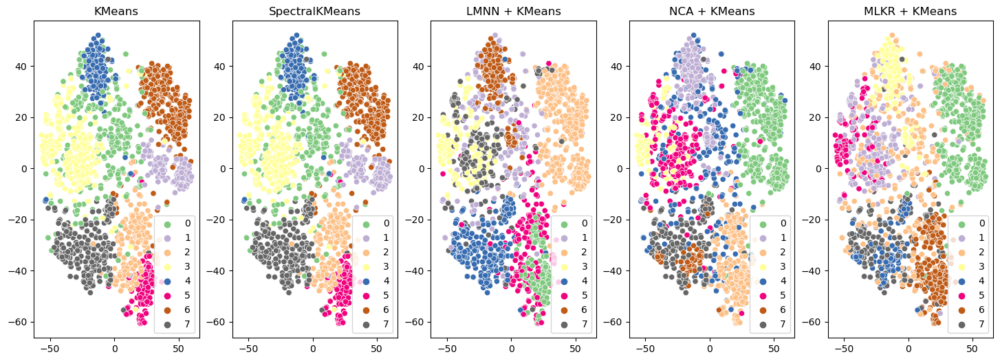

In [160]:
import seaborn as sns
_, ax = plt.subplots(nrows=1, ncols=5, figsize=(18, 6))
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labels_kmeans, ax=ax[0], palette=plt.get_cmap('Accent'), legend='full')
ax[0].set_title('KMeans')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labels_kmeans, ax=ax[1], palette=plt.get_cmap('Accent'), legend='full')
ax[1].set_title('SpectralKMeans')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labels_lmnn, ax=ax[2], palette=plt.get_cmap('Accent'), legend='full')
ax[2].set_title('LMNN + KMeans')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labels_nca, ax=ax[3], palette=plt.get_cmap('Accent'), legend='full')
ax[3].set_title('NCA + KMeans')
sns.scatterplot(x=X_p[:, 0], y=X_p[:, 1], hue=labels_mlkr, ax=ax[4], palette=plt.get_cmap('Accent'), legend='full')
ax[4].set_title('MLKR + KMeans')

Проанализируем три различных способа обучения метрики.

Время обучения:
LMNN Дольше всех обучается, так как используется метод градиентного спуска (без) для оптимизации функционала, что из-за структуры самого функционала приводит к большой вычислительной сложности.
NCA и MLKR в разы быстрее LMNN, так как хоть они тоже являются итерационными, но в них используются уже L-BFGS-B алгоритм.
Из чего делаем вывод что проводить оценки времени работы не имеет смысла, так как данные замеры относятся к конкретной реализации, а не общему алгоритму.

Кластеризация:
    Все 3 метода имеют достаточно сбалансированные классы и не как такового класса "оставшиеся", что характерно и для исходного KMeans. Заметной разницы по разбиению на кластеры заметить нельзя, поэтому судить о превосходстве одного метода над другим в кластеризации нельзя.

**LMNN**

In [162]:
check_val = np.array([5, 8, 10, 15, 20, 28, 45, 70, 100, 130, 170, 230, 300, 400, 600, 1000])
n_runs = 5
C = 250000

In [163]:
model_lmnn = LMNN(n_neighbors=5, init='auto', learn_rate=1e-3, verbose=True)
X_train_tr_lmnn, X_train_labeled_tr_lmnn, X_val_tr_lmnn, model_nca = transform(model_lmnn, X_train_labeled, X_train, X_val, y_train_labeled)

iter | objective | objective difference | active constraints | learning rate
2 781.6892984666706 -9293.488936583186 2203 0.00101
3 331.8717310435724 -449.8175674230982 153 0.0010201000000000001
4 318.2422445734019 -13.629486470170548 86 0.0010303010000000002
5 309.5999153325372 -8.642329240864683 61 0.0010406040100000003
6 302.43994502788496 -7.159970304652234 38 0.0010510100501000003
7 295.9660677283383 -6.473877299546643 28 0.0010615201506010002
8 289.9826797770537 -5.983387951284612 18 0.0010721353521070103
9 284.3501360564288 -5.632543720624881 11 0.0010828567056280804
10 278.90763875450034 -5.4424973019284835 7 0.0010936852726843613
11 273.5859591360125 -5.321679618487849 5 0.0011046221254112048
12 268.3506586369246 -5.235300499087884 5 0.001115668346665317
13 263.1774714067741 -5.173187230150518 5 0.00112682503013197
14 258.06882790648086 -5.108643500293226 4 0.0011380932804332896
15 253.0422374161989 -5.026590490281961 3 0.0011494742132376226
16 248.10684553186627 -4.93539188433

In [164]:
scores_lmnn = check_method(check_val, n_runs, X_train_labeled_tr_lmnn, X_train_tr_lmnn, X_val_tr_lmnn, y_train_labeled, y_val, C)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [10:22<00:00, 38.94s/it]


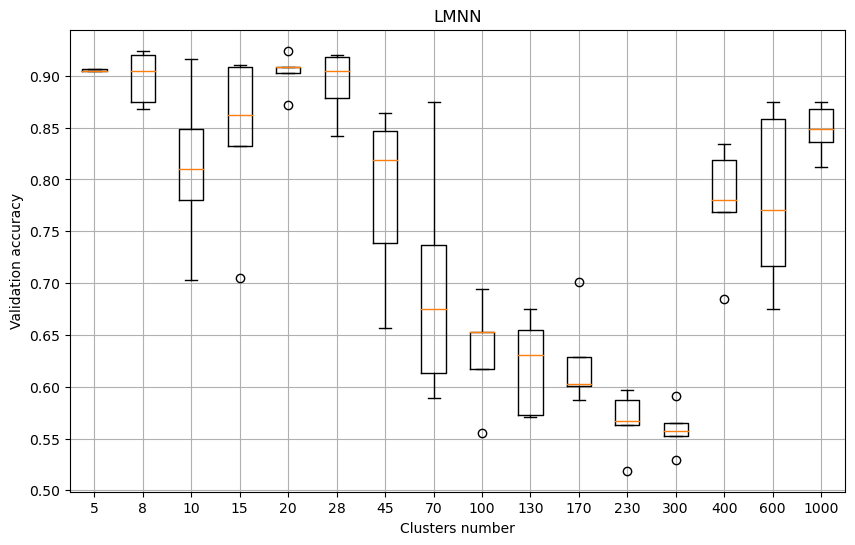

In [165]:
show_scores(scores_lmnn, check_val, "LMNN")

In [209]:
best_lmnn_n_cl = 5

In [167]:
X_test_tr_lmnn = model_lmnn.transform(X_test) 
fr_lmnn =final_result(X_train_tr_lmnn, X_train_labeled_tr_lmnn, X_test_tr_lmnn, y_train_labeled, y_test, best_lmnn_n_cl, C)

In [210]:
print(fr_lmnn)

0.9120287253141831


**NCA**

In [277]:
check_val = np.array([5, 8, 10, 15, 20, 28, 45, 70, 100, 130, 170, 230, 300, 400])
n_runs = 5
C = 1000

In [218]:
model_nca = NCA(init='auto', verbose=True)
X_train_tr_nca, X_train_labeled_tr_nca, X_val_tr_nca, model_nca = transform(model_nca, X_train_labeled, X_train, X_val, y_train_labeled)

[NCA]
[NCA]  Iteration      Objective Value    Time(s)
[NCA] ------------------------------------------
[NCA]          0         1.900326e+01       0.44
[NCA]          1         2.377873e+01       0.10
[NCA]          2         5.714198e+01       0.73
[NCA]          3         8.229444e+01       0.58
[NCA]          4         8.299999e+01       0.22
[NCA] Training took    19.07s.


In [265]:
scores_nca = check_method(check_val, n_runs, X_train_labeled_tr_nca, X_train_tr_nca, X_val_tr_nca, y_train_labeled, y_val, C)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [22:44<00:00, 97.48s/it]


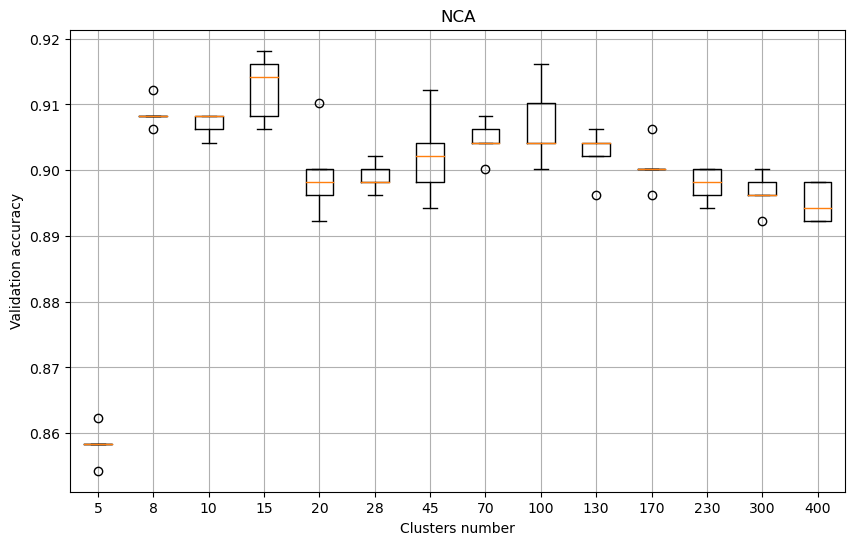

In [269]:
show_scores(scores_nca, check_val, "NCA")

In [270]:
best_nca_n_cl = 15

In [278]:
X_test_tr_nca = model_nca.transform(X_test) 
fr_nca = final_result(X_train_tr_nca, X_train_labeled_tr_nca, X_test_tr_nca, y_train_labeled, y_test, best_nca_n_cl, C)

In [280]:
print(fr_nca, C)

0.9084380610412927 1000


**MLKR**

In [284]:
check_val = np.array([5, 8, 10, 15, 20, 28, 45, 70, 100, 130])
n_runs = 5
C = 200000

In [282]:
model_mlkr = MLKR(init='auto', verbose=True)
X_train_tr_mlkr, X_train_labeled_tr_mlkr, X_val_tr_mlkr, model_mlkr = transform(model_mlkr, X_train_labeled, X_train, X_val, y_train_labeled)

[MLKR]
[MLKR]  Iteration      Objective Value    Time(s)
[MLKR] ------------------------------------------
[MLKR]          0         1.583706e+02       0.07
[MLKR]          1         1.201481e+02       0.10
[MLKR]          2         1.929717e+01       0.05
[MLKR]          3         6.396567e+00       0.05
[MLKR]          4         1.335458e+00       0.07
[MLKR]          5         4.333181e-01       0.06
[MLKR]          6         2.719852e-01       0.05
[MLKR]          7         1.205726e-01       0.07
[MLKR]          8         7.493632e-02       0.11
[MLKR]          9         3.770030e-02       0.09
[MLKR]         10         2.427040e-02       0.07
[MLKR]         11         1.563247e-02       0.13
[MLKR]         12         2.300136e-02       0.09
[MLKR]         13         1.238070e-02       0.04
[MLKR]         14         7.012112e-03       0.08
[MLKR]         15         3.911523e-03       0.10
[MLKR]         16         2.757136e-03       0.07
[MLKR]         17         1.489025e-03     

In [285]:
scores_mlkr = check_method(check_val, n_runs, X_train_labeled_tr_mlkr, X_train_tr_mlkr, X_val_tr_mlkr, y_train_labeled, y_val, C)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [05:15<00:00, 31.54s/it]


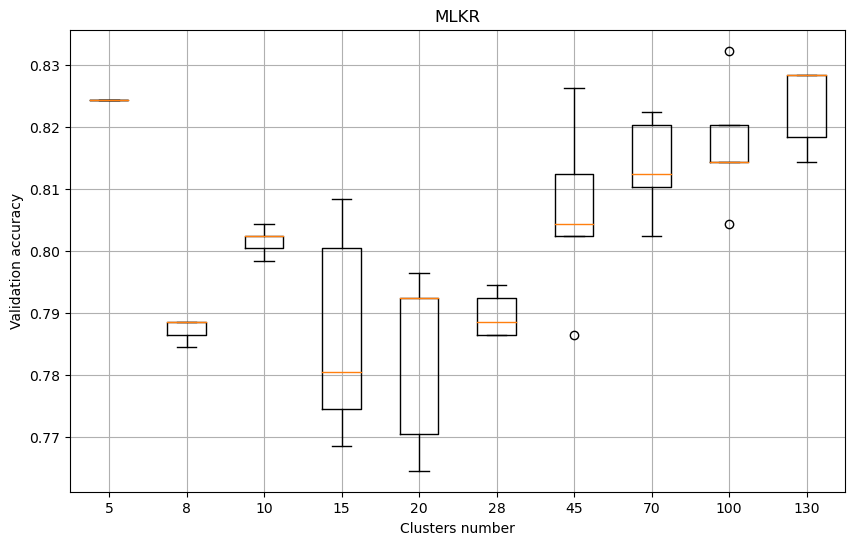

In [286]:
show_scores(scores_mlkr, check_val, "MLKR")

In [287]:
best_mlkr_n_cl = 130

In [288]:
X_test_tr_mlkr = model_mlkr.transform(X_test) 
fr_mlkr = final_result(X_train_tr_mlkr, X_train_labeled_tr_mlkr, X_test_tr_mlkr, y_train_labeled, y_test, best_mlkr_n_cl, C)

**Logistic regression**

In [207]:
logreg = LogisticRegression(penalty='l2', max_iter=1000, C=250000)
logreg.fit(X_train_labeled, y_train_labeled)
fr_logreg = accuracy_score(y_test, logreg.predict(X_test))

In [208]:
print(fr_logreg)

0.8922800718132855


**Logistic regression + kmeans**

In [299]:
scores_non_trained = check_method(check_val, n_runs, X_train_labeled, X_train, X_val, y_train_labeled, y_val, C=1000)

 60%|███████████████████████████████████████████████████████████▍                                       | 6/10 [00:41<00:28,  7.13s/it]/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/dirak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please al

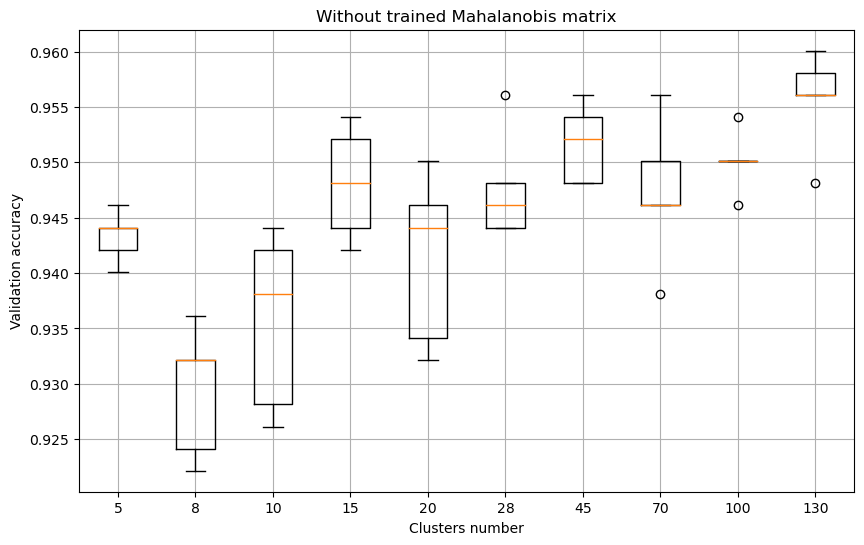

In [300]:
show_scores(scores_non_trained, check_val, "Without trained Mahalanobis matrix")

In [302]:
best_non_trained_n_cl = 130

In [305]:
fr_non_trained = final_result(X_train, X_train_labeled, X_test, y_train_labeled, y_test, best_non_trained_n_cl, C=1000)

In [306]:
print(fr_lmnn)
print(fr_nca)
print(fr_mlkr)
print(fr_logreg)
print(fr_non_trained)

0.9120287253141831
0.9084380610412927
0.7935368043087971
0.8922800718132855
0.9461400359066428


(?) Сделайте выводы о применимости методов кластеризации для улучшения качества классификации. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:**
Результат говорит о том, что класстеризация значительно улучшает качество модели. Так kmeans без обучаемой матрицы преазошел на 0.05 baseline. Остальные методы также показали хороший прирост.